# scVI-Based Correction and Clustering of Fetal Stem Cells

**Developed by:** Anna Maguza\
**Affiliation:** Faculty of Medicine, Würzburg University\
**Creation date:** 8th January 2025\
**Last modified date:** 8th January 2025

In this notebook, we:
+ Visualize the uncorrected PCA and UMAP embeddings of the dataset.
+ Apply scVI for dataset correction and evaluate the correction with `scIB`metrics. 
+ Perform leiden clustering to identify distinct subpopulations within fetal stem cells.

## Import packages

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import anndata
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
import seaborn as sns
from scib_metrics.benchmark import Benchmarker
import scipy

import json
from datetime import datetime

2025-01-08 11:10:59.541081: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-08 11:10:59.541119: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-08 11:10:59.541142: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-08 11:10:59.936914: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Setup working environment

In [2]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

In [5]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

In [6]:
timestamp = datetime.now().strftime('%d%m%Y_%H%M%S')

## Upload data

In [7]:
adata = sc.read_h5ad('Processed_data/integration_of_remapped_data/gut_hs_all_datasets_scVI_scANVI_epithelial_cellstates_AM_07012025_171437_raw.h5ad')
adata

AnnData object with n_obs × n_vars = 119258 × 43704
    obs: 'cell_id', 'Source Name', 'ENA_SAMPLE', 'BioSD_SAMPLE', 'organism', 'disease', 'organism_part', 'cell_type', 'growth_condition', 'developmental_stage', 'Material Type', 'Protocol REF', 'sample_id', 'LIBRARY_LAYOUT', 'cdna_read_size', 'cell_barcode_size', 'end_bias', 'library_construction', 'sample_barcode_size', 'umi_barcode_offset', 'umi_barcode_size', 'Performer', 'Assay Name', 'ENA_EXPERIMENT', 'ENA_RUN', 'time', 'time_unit', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'cell_passed_qc', 'qc_cluster', 'cluster_passed_qc', 'consensus_fraction', 'consensus_passed_qc', 'total_counts', 'n_genes_by_counts', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'sex', 'S_score', 'G2M_score', 'Cell_cycle_phase', 'Study_name', 'ArrayExpress_ID', 'library_preparation_protoc

In [8]:
adata = adata[adata.obs['cellstates_scANVI'] == 'Stem cells']

In [9]:
adata = adata[adata.obs['age_group'].isin(['first trimester', 'second trimester'])]

In [10]:
adata

View of AnnData object with n_obs × n_vars = 3882 × 43704
    obs: 'cell_id', 'Source Name', 'ENA_SAMPLE', 'BioSD_SAMPLE', 'organism', 'disease', 'organism_part', 'cell_type', 'growth_condition', 'developmental_stage', 'Material Type', 'Protocol REF', 'sample_id', 'LIBRARY_LAYOUT', 'cdna_read_size', 'cell_barcode_size', 'end_bias', 'library_construction', 'sample_barcode_size', 'umi_barcode_offset', 'umi_barcode_size', 'Performer', 'Assay Name', 'ENA_EXPERIMENT', 'ENA_RUN', 'time', 'time_unit', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'cell_passed_qc', 'qc_cluster', 'cluster_passed_qc', 'consensus_fraction', 'consensus_passed_qc', 'total_counts', 'n_genes_by_counts', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'sex', 'S_score', 'G2M_score', 'Cell_cycle_phase', 'Study_name', 'ArrayExpress_ID', 'library_preparation_

In [11]:
del adata.obsm['X_pca'], adata.obsm['X_scANVI'], adata.obsm['X_scVI'], adata.obsm['X_umap'], adata.obsm['umap_uncorrected']

In [12]:
adata_raw = adata.copy()

## Visualize uncorrected dataset

In [13]:
adata_log = adata.copy()
sc.pp.normalize_total(adata_log, target_sum=1e6, exclude_highly_expressed=True)
sc.pp.log1p(adata_log)

normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['SST', 'ATG10', 'RPL30-AS1', 'TALAM1', 'LYZ', 'ENSG00000273149', 'MT-RNR1', 'MT-RNR2', 'MT-CO1', 'MT-CO3']
    finished (0:00:00)


In [14]:
sc.pp.pca(adata_log)

computing PCA
    with n_comps=50
    finished (0:00:06)


In [15]:
sc.pp.neighbors(adata_log, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata_log)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:03)


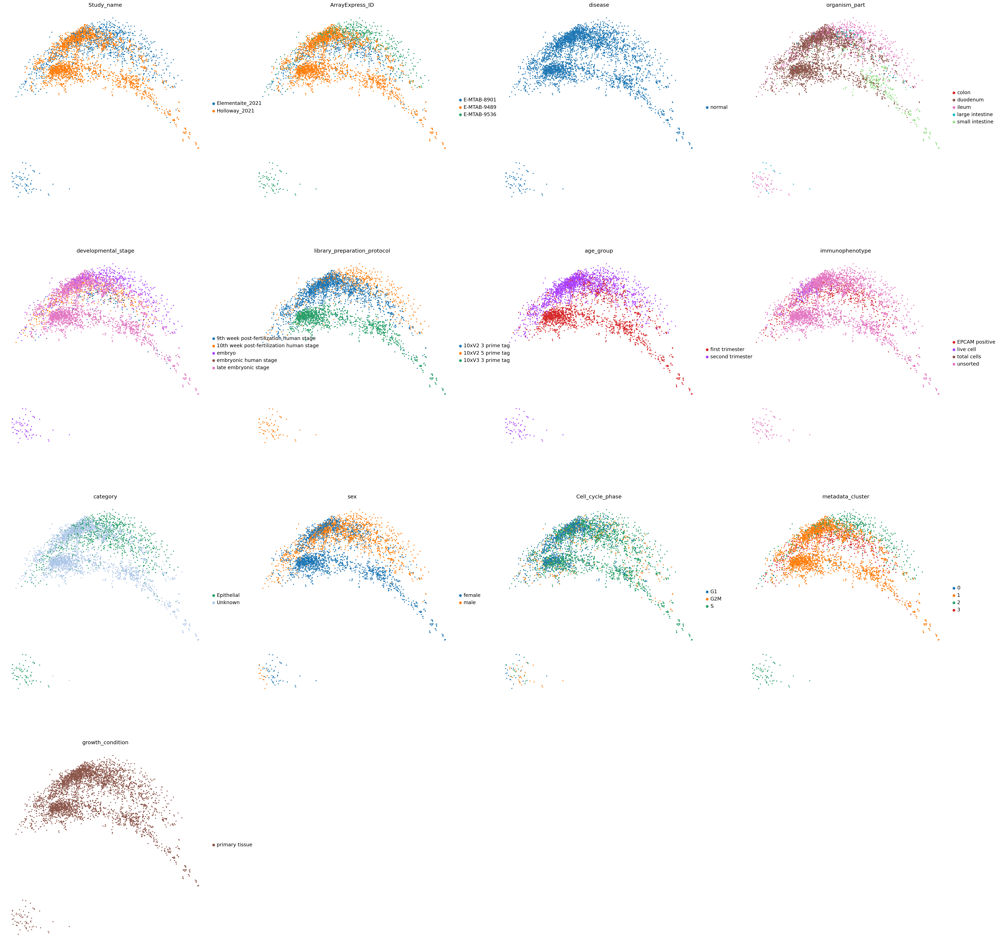

In [16]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.pca(adata_log,color=["Study_name", "ArrayExpress_ID", 'disease', 'organism_part', 'developmental_stage', 'library_preparation_protocol', 'age_group', 'immunophenotype', 'category', 'sex', 'Cell_cycle_phase', 'metadata_cluster', 'growth_condition'], ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_uncorrected_PCA_categorical_values.png", bbox_inches="tight")

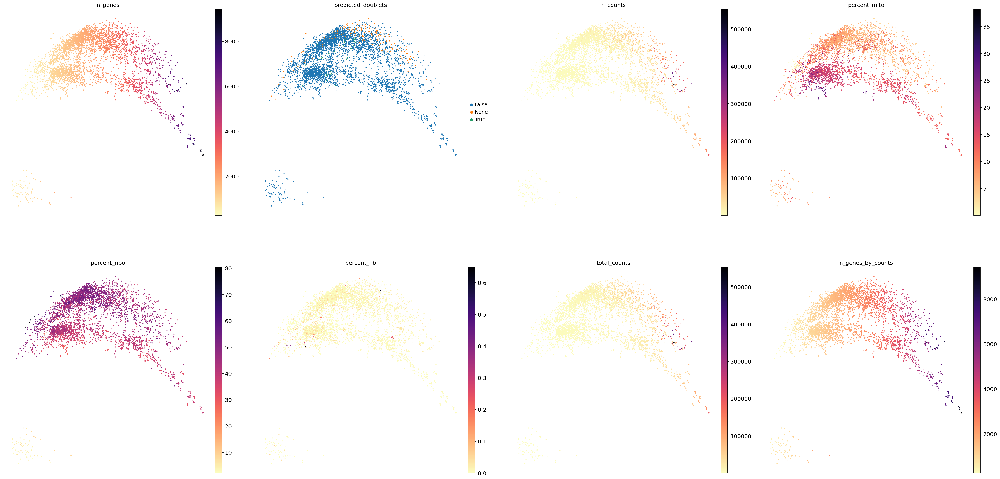

In [17]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.pca(adata_log,color=['n_genes', 'predicted_doublets', 'n_counts', 'percent_mito', 'percent_ribo', 'percent_hb', 'total_counts', 'n_genes_by_counts'], color_map = 'magma_r', ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_uncorrected_PCA_continious_values.png", bbox_inches="tight")

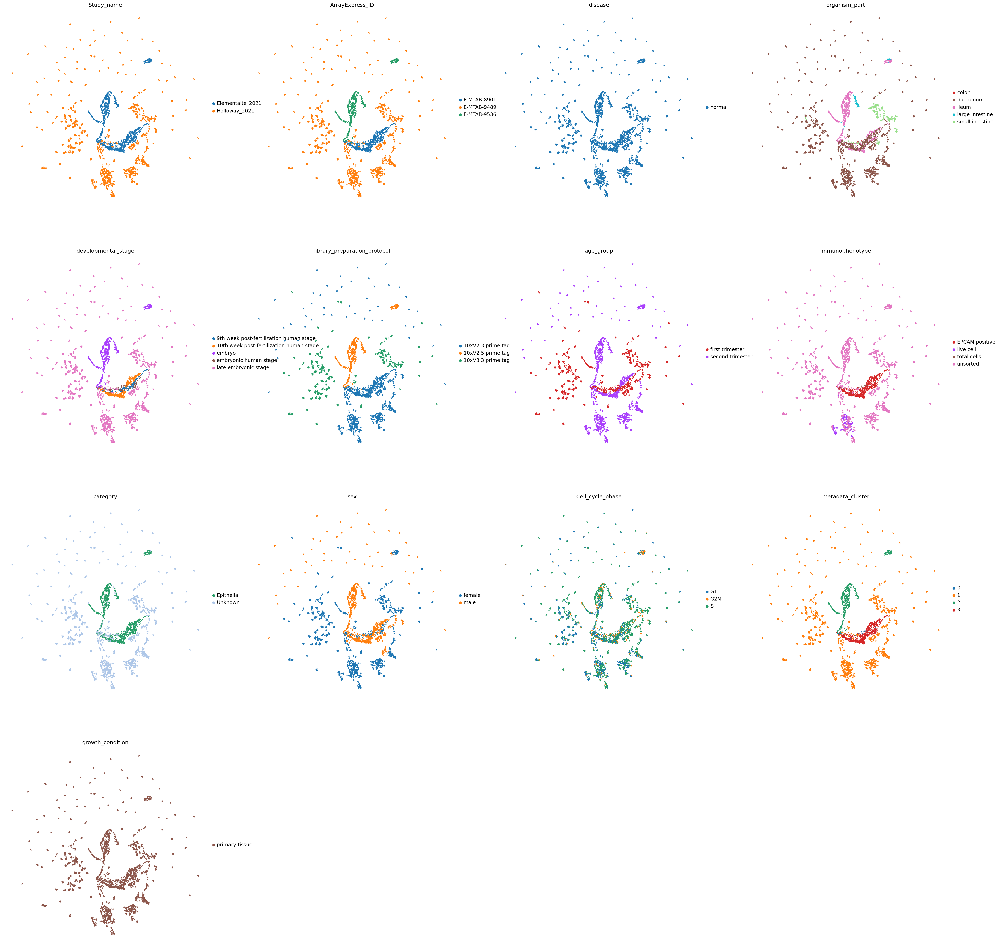

In [18]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.umap(adata_log,color=["Study_name", "ArrayExpress_ID", 'disease', 'organism_part', 'developmental_stage', 'library_preparation_protocol', 'age_group', 'immunophenotype', 'category', 'sex', 'Cell_cycle_phase', 'metadata_cluster', 'growth_condition'], ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_uncorrected_umap_categorical_values.png", bbox_inches="tight")

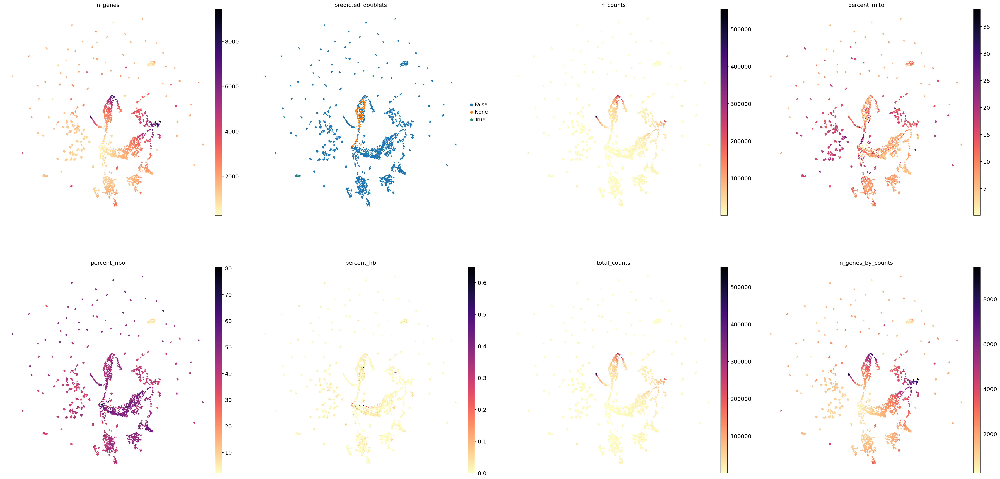

In [19]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.umap(adata_log,color=['n_genes', 'predicted_doublets', 'n_counts', 'percent_mito', 'percent_ribo', 'percent_hb', 'total_counts', 'n_genes_by_counts'], color_map = 'magma_r', ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_uncorrected_umap_continious_values.png", bbox_inches="tight")

In [16]:
adata.obsm['X_pca'] = adata_log.obsm['X_pca'].copy()
adata.obsm['umap_uncorrected'] = adata_log.obsm['X_umap'].copy()

## Extract highly variable genes

In [17]:
adata.layers["counts"] = adata.X.copy()

In [18]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "ArrayExpress_ID",
    subset = True,
    span = 1
)
adata

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 3882 × 7000
    obs: 'cell_id', 'Source Name', 'ENA_SAMPLE', 'BioSD_SAMPLE', 'organism', 'disease', 'organism_part', 'cell_type', 'growth_condition', 'developmental_stage', 'Material Type', 'Protocol REF', 'sample_id', 'LIBRARY_LAYOUT', 'cdna_read_size', 'cell_barcode_size', 'end_bias', 'library_construction', 'sample_barcode_size', 'umi_barcode_offset', 'umi_barcode_size', 'Performer', 'Assay Name', 'ENA_EXPERIMENT', 'ENA_RUN', 'time', 'time_unit', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'cell_passed_qc', 'qc_cluster', 'cluster_passed_qc', 'consensus_fraction', 'consensus_passed_qc', 'total_counts', 'n_genes_by_counts', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'sex', 'S_score', 'G2M_score', 'Cell_cycle_phase', 'Study_name', 'ArrayExpress_ID', 'library_preparation_protocol'

## Run scVI

In [19]:
adata.layers['counts'] = adata.X.copy()

In [20]:
scvi.model.SCVI.setup_anndata(adata, 
                              categorical_covariate_keys=['sample_id', 'organism_part', 'ArrayExpress_ID'],
                              labels_key = "cellstates_scANVI", 
                              layer = 'counts')

In [21]:
scvi_model = scvi.model.SCVI(adata,
                            n_latent = 15, 
                            n_hidden = 64,
                            n_layers = 2, 
                            dropout_rate = 0.1,
                            dispersion = 'gene-batch', 
                            gene_likelihood = 'nb')

In [22]:
scvi_model.train(300, 
                early_stopping = True,
                early_stopping_patience = 10,
                check_val_every_n_epoch = 1, 
                enable_progress_bar = True, 
                accelerator = "gpu",
                devices = [1])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Training:   0%|          | 0/300 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 2636.262. Signaling Trainer to stop.


In [23]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

#### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

In [24]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars=['epoch'])
)

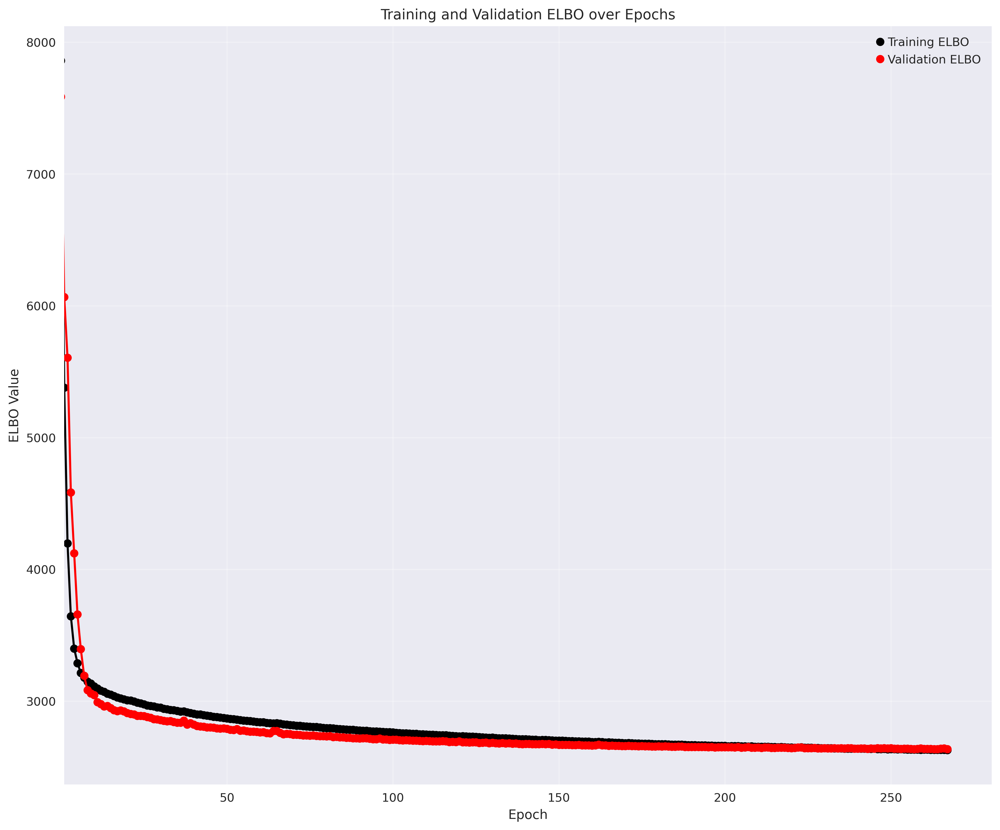

In [25]:
plt.style.use('seaborn')
plt.figure(figsize=(12, 10))

plt.plot(history_df[history_df['variable'] == 'elbo_train']['epoch'], 
         history_df[history_df['variable'] == 'elbo_train']['value'], 
         color='black', marker='o', label='Training ELBO')

plt.plot(history_df[history_df['variable'] == 'elbo_validation']['epoch'],
         history_df[history_df['variable'] == 'elbo_validation']['value'], 
         color='red', marker='o', label='Validation ELBO')

plt.xlabel('Epoch')
plt.ylabel('ELBO Value')
plt.title('Training and Validation ELBO over Epochs')
plt.legend()
plt.grid(True, alpha=0.3)

plt.xlim(left=1)

plt.tight_layout()
plt.show()

#plt.savefig(f'Processed_data/integration_of_remapped_data/epithelial_scvi_model_{timestamp}/scvi_cell_types_elbo.png', dpi=300, bbox_inches='tight')

+ Visualize dataset

In [26]:
sc.pp.neighbors(adata, use_rep = "X_scVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


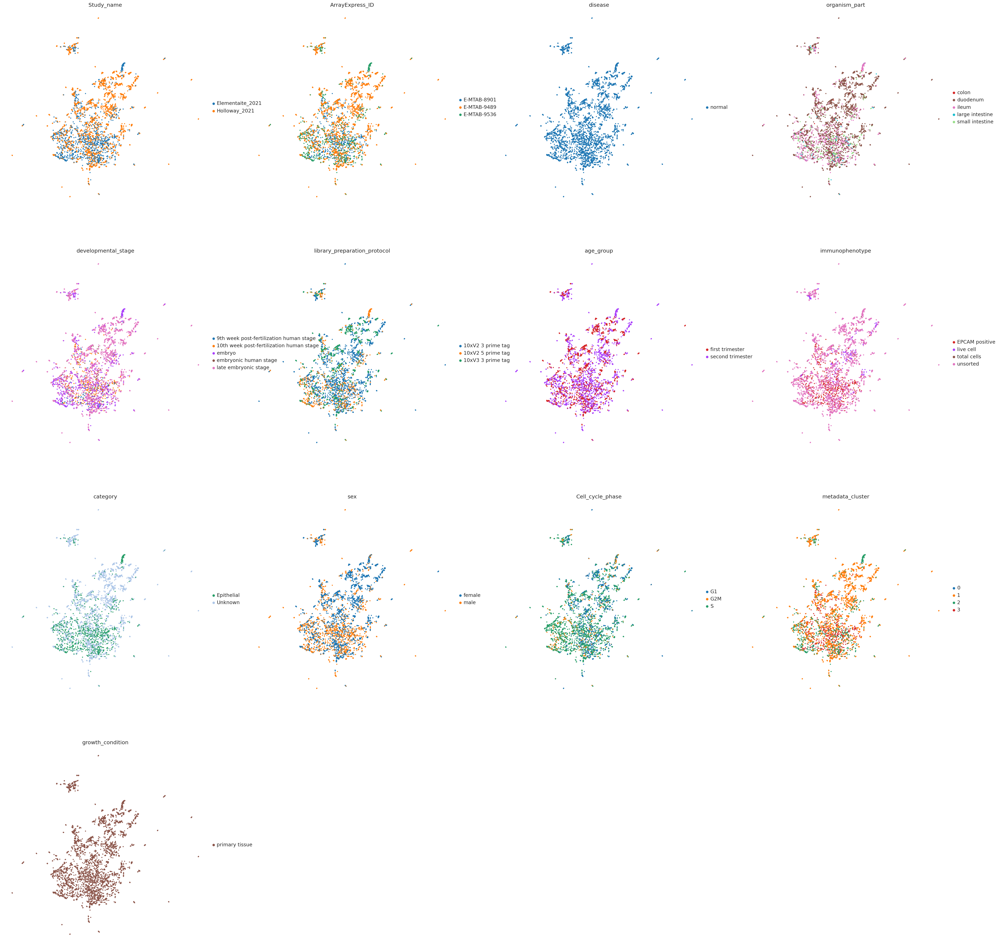

In [27]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.umap(adata,color=["Study_name", "ArrayExpress_ID", 'disease', 'organism_part', 'developmental_stage', 'library_preparation_protocol', 'age_group', 'immunophenotype', 'category', 'sex', 'Cell_cycle_phase', 'metadata_cluster', 'growth_condition'], ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_corrected_umap_categorical_values_{timestamp}.png", bbox_inches="tight")

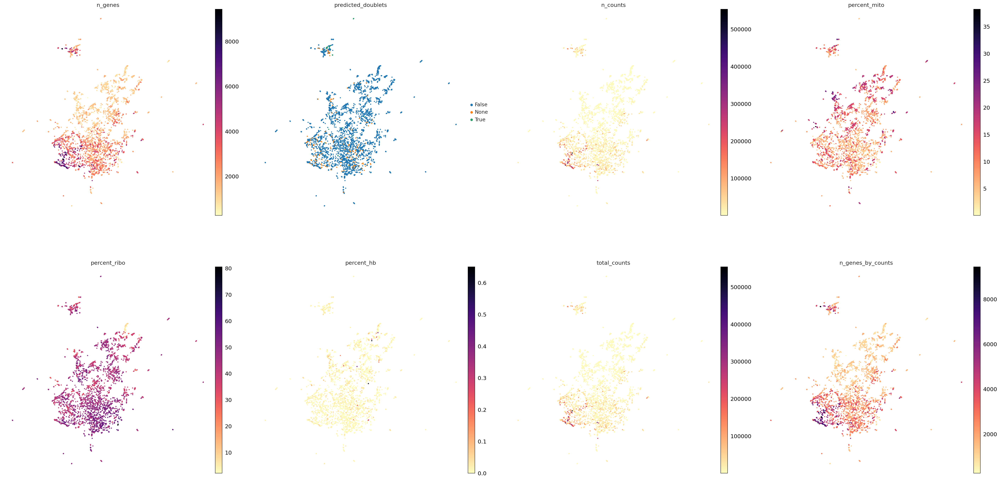

In [28]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.umap(adata,color=['n_genes', 'predicted_doublets', 'n_counts', 'percent_mito', 'percent_ribo', 'percent_hb', 'total_counts', 'n_genes_by_counts'], color_map = 'magma_r', ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_corrected_umap_continious_values_{timestamp}.png", bbox_inches="tight")

## Leiden clustering

In [43]:
sc.tl.leiden(adata, resolution = 0.1, random_state = 1786)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


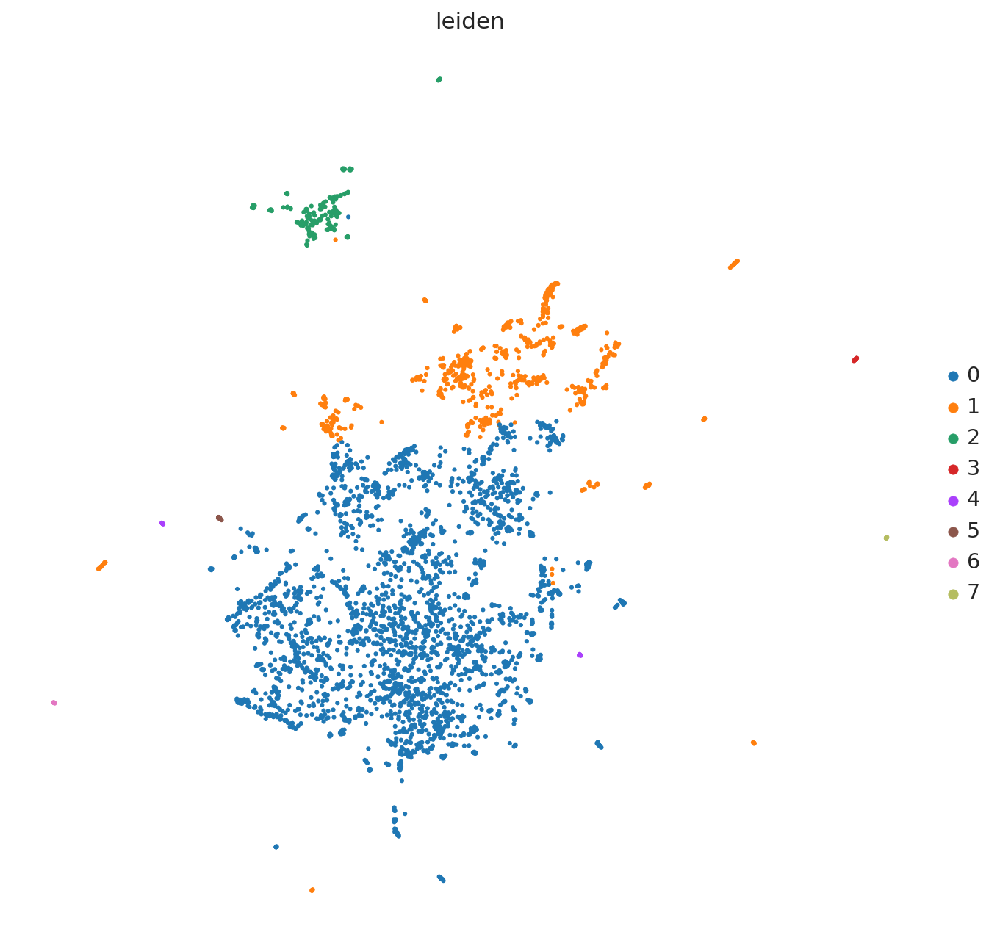

In [44]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.set_figure_params(figsize=(10,10))
    sc.pl.umap(adata,color=["leiden"], ncols=4, frameon=False, show=False)
    plt.savefig(f"Processed_data/fetalSC_exploring/plots/fetalSC_corrected_umap_leiden_{timestamp}.png", bbox_inches="tight")

## Save anndata object

In [31]:
adata_export = adata_raw.copy()

In [32]:
adata

AnnData object with n_obs × n_vars = 3882 × 7000
    obs: 'cell_id', 'Source Name', 'ENA_SAMPLE', 'BioSD_SAMPLE', 'organism', 'disease', 'organism_part', 'cell_type', 'growth_condition', 'developmental_stage', 'Material Type', 'Protocol REF', 'sample_id', 'LIBRARY_LAYOUT', 'cdna_read_size', 'cell_barcode_size', 'end_bias', 'library_construction', 'sample_barcode_size', 'umi_barcode_offset', 'umi_barcode_size', 'Performer', 'Assay Name', 'ENA_EXPERIMENT', 'ENA_RUN', 'time', 'time_unit', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'cell_passed_qc', 'qc_cluster', 'cluster_passed_qc', 'consensus_fraction', 'consensus_passed_qc', 'total_counts', 'n_genes_by_counts', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'sex', 'S_score', 'G2M_score', 'Cell_cycle_phase', 'Study_name', 'ArrayExpress_ID', 'library_preparation_protocol'

In [33]:
adata_export.obs['leiden_cluster'] = adata.obs['leiden'].copy()
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_pca'] = adata.obsm['X_pca'].copy()
adata_export.obsm['umap_uncorrected'] = adata.obsm['umap_uncorrected'].copy()

In [34]:
current_history = adata_export.uns['processing_history'].tolist()

new_entry = json.dumps({
    'timestamp': timestamp,
    'step': 'Extracted 7000 hvg (batch ArrayExpress_ID), scVI correction, scvi params: batch = sample_id, organism_part, ArrayExpress_ID, n_latent = 15, n_hidden = 64, n_layers = 2, dropout_rate = 0.1, dispersion = gene-batch, gene_likelihood = nb, 280 epochs',
})
current_history.append(new_entry)

adata_export.uns['processing_history'] = current_history

In [35]:
project = 'gut'
species = 'hs'
name = 'AM'
counts = 'raw'
atribute = 'fetalSC'

adata_export.write_h5ad(f"Processed_data/fetalSC_exploring/{project}_{species}_{atribute}_{name}_{timestamp}_{counts}.h5ad")

## Run scBI

In [36]:
if scipy.sparse.issparse(adata.X):
    adata.X = adata.X.astype('float32')
else:
    adata.X = adata.X.astype('float32')

computing PCA
    with n_comps=50
    finished (0:00:01)


Embeddings:   0%|                                   | 0/3 [00:00<?, ?it/s]WARNING:jax._src.xla_bridge:An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  33%|█████████                  | 1/3 [00:06<00:12,  6.09s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  67%|██████████████████         | 2/3 [00:10<00:05,  5.12s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings: 100%|███████████████████████████| 3/3 [00:13<00:00,  4.39s/it]


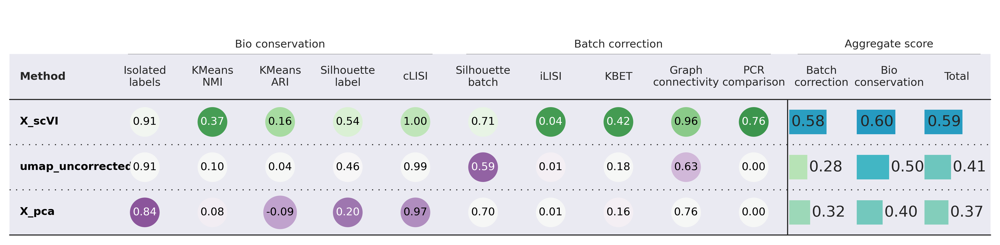

In [37]:
bm = Benchmarker(
    adata,
    batch_key='sample_id',
    label_key='leiden',
    embedding_obsm_keys=['X_scVI', 'X_pca', 'umap_uncorrected'],
    n_jobs=-1
)
bm.benchmark()

bm.plot_results_table(min_max_scale=False)

computing PCA
    with n_comps=50
    finished (0:00:01)


Embeddings:   0%|                                   | 0/3 [00:00<?, ?it/s]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  33%|█████████                  | 1/3 [00:04<00:09,  4.64s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  67%|██████████████████         | 2/3 [00:10<00:05,  5.17s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings: 100%|███████████████████████████| 3/3 [00:12<00:00,  4.29s/it]


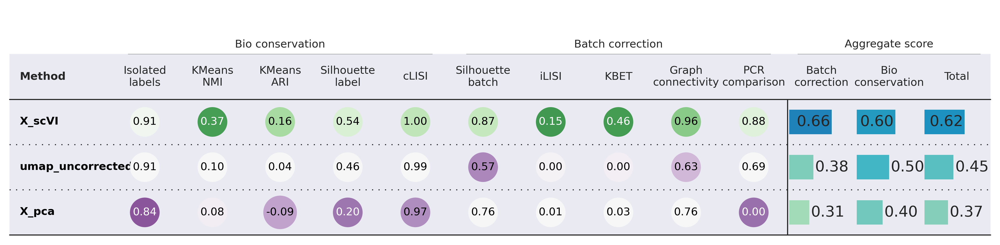

In [38]:
bm = Benchmarker(
    adata,
    batch_key='ArrayExpress_ID',
    label_key='leiden',
    embedding_obsm_keys=['X_scVI', 'X_pca', 'umap_uncorrected'],
    n_jobs=-1
)
bm.benchmark()

bm.plot_results_table(min_max_scale=False)

computing PCA
    with n_comps=50
    finished (0:00:01)


Embeddings:   0%|                                   | 0/3 [00:00<?, ?it/s]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  33%|█████████                  | 1/3 [00:04<00:09,  4.59s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings:  67%|██████████████████         | 2/3 [00:09<00:04,  4.79s/it]

INFO     3 consists of a single batch or is too small. Skip.                                                       
INFO     4 consists of a single batch or is too small. Skip.                                                       
INFO     5 consists of a single batch or is too small. Skip.                                                       
INFO     6 consists of a single batch or is too small. Skip.                                                       
INFO     7 consists of a single batch or is too small. Skip.                                                       


Embeddings: 100%|███████████████████████████| 3/3 [00:12<00:00,  4.09s/it]


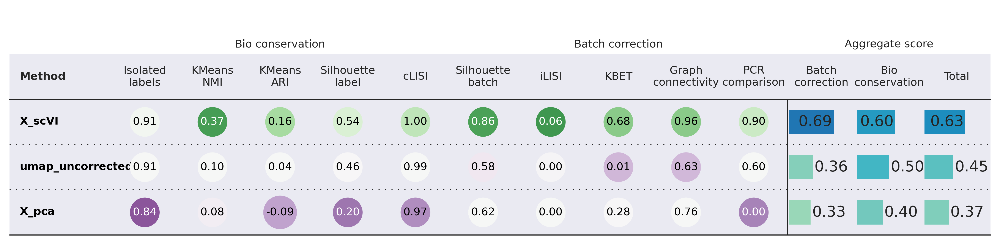

In [39]:
bm = Benchmarker(
    adata,
    batch_key='organism_part',
    label_key='leiden',
    embedding_obsm_keys=['X_scVI', 'X_pca', 'umap_uncorrected'],
    n_jobs=-1
)
bm.benchmark()

bm.plot_results_table(min_max_scale=False)

In [40]:
timestamp

'08012025_111100'